In [105]:
import numpy as np
import pandas as pd 
from astropy.coordinates import SkyCoord  
from astropy.coordinates import ICRS, Galactic, FK4, FK5  
from astropy.coordinates import Angle, Latitude, Longitude 
from astropy import units as u
from mw_plot import MWPlot, MWSkyMap
from mpl_toolkits import mplot3d
from sklearn.preprocessing import MaxAbsScaler

In [4]:
stars = pd.read_csv("C:/Users/you/Documents/your/local/path/hygdata_v3.csv")

In [5]:
stars.head()

,id,hip,hd,hr,gl,bf,proper,ra,dec,dist,...,bayer,flam,con,comp,comp_primary,base,lum,var,var_min,var_max
0,0,NaN,NaN,NaN,NaN,NaN,Sol,0.000000,0.000000,0.0000,...,NaN,NaN,NaN,1,0,NaN,1.000000,NaN,NaN,NaN
1,1,1.0,224700.0,NaN,NaN,NaN,NaN,0.000060,1.089009,219.7802,...,NaN,NaN,Psc,1,1,NaN,9.638290,NaN,NaN,NaN
2,2,2.0,224690.0,NaN,NaN,NaN,NaN,0.000283,-19.498840,47.9616,...,NaN,NaN,Cet,1,2,NaN,0.392283,NaN,NaN,NaN
3,3,3.0,224699.0,NaN,NaN,NaN,NaN,0.000335,38.859279,442.4779,...,NaN,NaN,And,1,3,NaN,386.901132,NaN,NaN,NaN
4,4,4.0,224707.0,NaN,NaN,NaN,NaN,0.000569,-51.893546,134.2282,...,NaN,NaN,Phe,1,4,NaN,9.366989,NaN,NaN,NaN


In [6]:
pc = stars.loc[stars['proper'] == 'Proxima Centauri'].iloc[0]
pc

id                         70666
hip                      70890.0
hd                           NaN
hr                           NaN
gl                        Gl 551
bf                           NaN
proper          Proxima Centauri
ra                     14.495985
dec                   -62.679485
dist                      1.2959
pmra                    -3775.64
pmdec                     768.16
rv                         -16.0
mag                        11.01
absmag                    15.447
spect                       M5Ve
ci                         1.807
x                      -0.472264
y                      -0.361451
z                      -1.151219
vx                     -0.000012
vy                      0.000021
vz                      0.000017
rarad                    3.79504
decrad                 -1.093963
pmrarad                -0.000018
pmdecrad                0.000004
bayer                        NaN
flam                         NaN
con                          Cen
comp      

In [147]:
radius = pc['dist']*5
pcra = Longitude(pc['ra'], unit=u.deg)
pcdec = np.array(pc['dec']) * u.deg
pcdist = np.array(pc['dist']) * u.pc
print(f'Radius: {radius}\nRadial Ascension: {pcra}\nDeclination: {pcdec}\nDistance {pcdist}')

Radius: 6.4795
Radial Ascension: 14.495985 deg
Declination: -62.679485 deg
Distance 1.2959 pc


In [148]:
p = SkyCoord(ra=pcra, 
             dec=pcdec, 
             distance=pcdist, 
             obstime='2001-01-01T12:00:00')
print(p)

<SkyCoord (ICRS): (ra, dec, distance) in (deg, deg, pc)
    (14.495985, -62.679485, 1.2959)>


In [156]:
plot_instance = MWPlot(mode='face-on',
                       center=(0, 0)*u.kpc,
                       radius=radius*u.kpc,
                       unit=u.kpc,
                       coord='galactic',
                       annotation=True, 
                       rot180=False,
                       grayscale=True)
plot_instance.dpi = 200
plot_instance.clim = (5., 15.)
plot_instance.imalpha = .5
plot_instance.s = radius*6

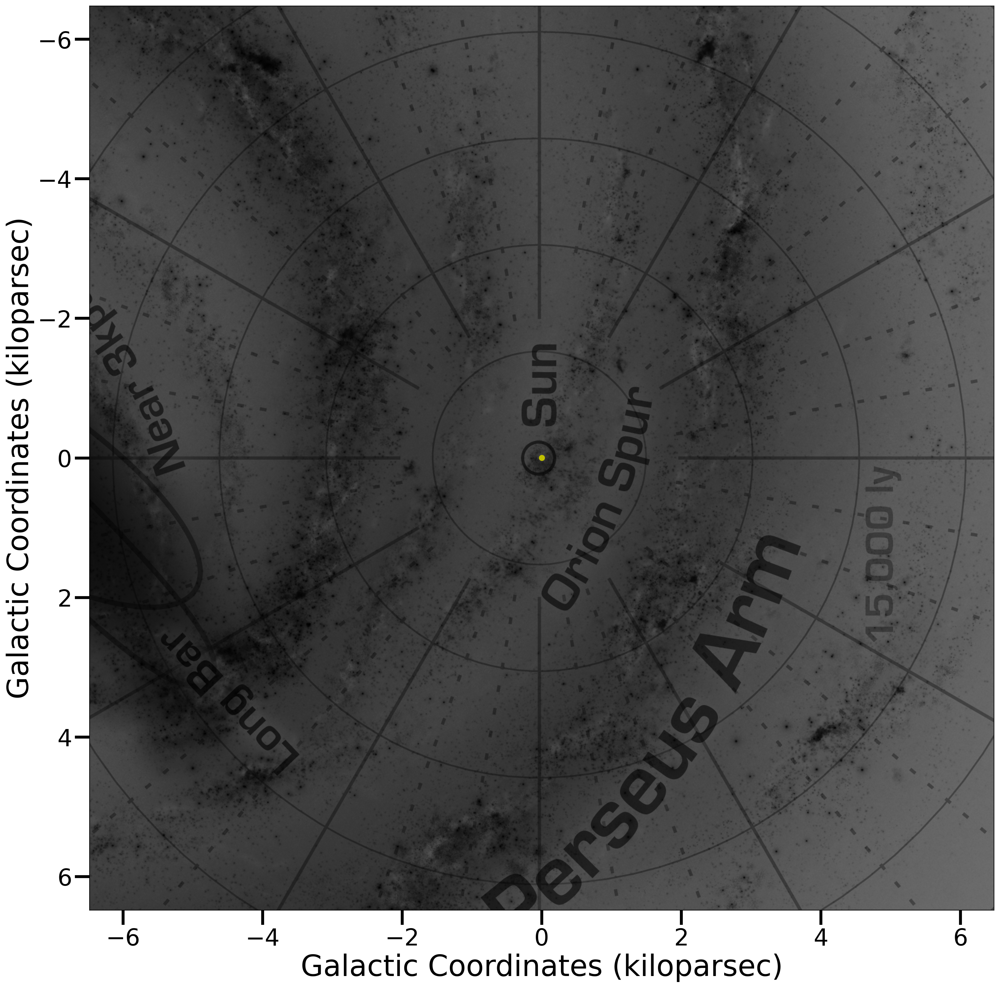

In [157]:
plot_instance.mw_scatter(-p.galactic.cartesian.x,
                         p.galactic.cartesian.y,
                         c='y')

In [74]:
sir = stars.loc[stars['proper'] == 'Sirius'].iloc[0]
sir

id                  32263
hip               32349.0
hd                48915.0
hr                 2491.0
gl                Gl 244A
bf               9Alp CMa
proper             Sirius
ra               6.752481
dec            -16.716116
dist               2.6371
pmra              -546.01
pmdec            -1223.08
rv                   -9.4
mag                 -1.44
absmag              1.454
spect              A0m...
ci                  0.009
x               -0.494323
y                2.476731
z               -0.758485
vx                0.00001
vy              -0.000012
vz              -0.000012
rarad            1.767795
decrad          -0.291751
pmrarad         -0.000003
pmdecrad        -0.000006
bayer                 Alp
flam                  9.0
con                   CMa
comp                    1
comp_primary        32263
base               Gl 244
lum             22.824433
var                   NaN
var_min            -1.333
var_max            -1.523
Name: 32263, dtype: object

In [75]:
sirra = Longitude(sir['ra'], unit=u.deg)
sirdec = np.array(sir['dec']) * u.deg
sirdist = np.array(sir['dist']) * u.pc
print(f'Radial Ascension: {sirra}\nDeclination: {sirdec}\nDistance {sirdist}')

Radial Ascension: 6.752481 deg
Declination: -16.716116 deg
Distance 2.6371 pc


In [76]:
s = SkyCoord(ra=sirra, 
             dec=sirdec, 
             distance=sirdist, 
             obstime='2001-01-01T12:00:00')
print(s)

<SkyCoord (ICRS): (ra, dec, distance) in (deg, deg, pc)
    (6.752481, -16.716116, 2.6371)>


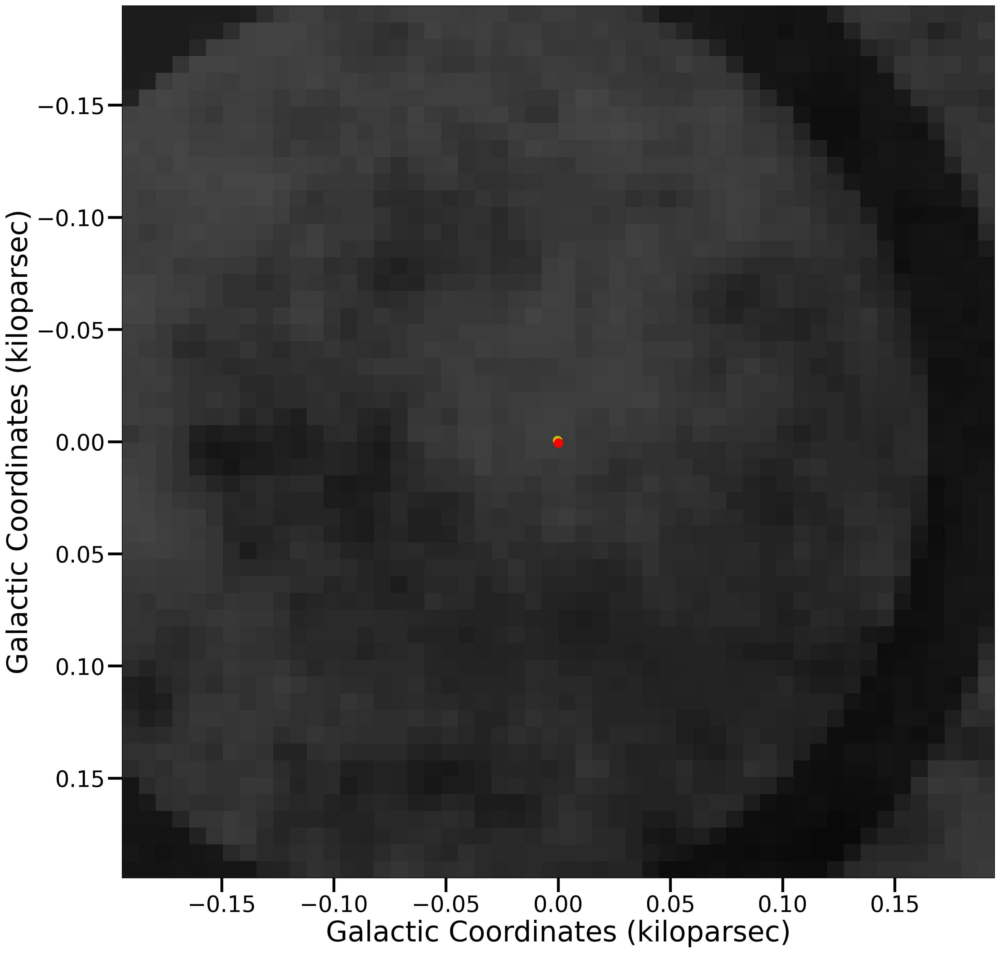

In [87]:
radius = pc['dist']*.15
plot_instance = MWPlot(mode='face-on',
                       center=(0, 0)*u.kpc,
                       radius=radius*u.kpc,
                       unit=u.kpc,
                       coord='galactic',
                       annotation=True, 
                       rot180=False,
                       grayscale=True)
plot_instance.dpi = 200
plot_instance.clim = (5., 15.)
plot_instance.imalpha = .5
plot_instance.s = radius*600
plot_instance.mw_scatter(-p.galactic.cartesian.x,
                         p.galactic.cartesian.y,
                         c='y')
plot_instance.mw_scatter(-s.galactic.cartesian.x, 
                         s.galactic.cartesian.y,
                         c='r')

In [88]:
allra = Longitude(stars['ra'], unit=u.deg)
alldec = np.array(stars['dec']) * u.deg
alldist = np.array(stars['dist']) * u.pc
print(f'Radial Ascension: {allra}\nDeclination: {alldec}\nDistance {alldist}')

Radial Ascension: [0.0000000e+00 6.0000000e-05 2.8300000e-04 ... 2.3996218e+01 2.3997386e+01
 3.6059000e-02] deg
Declination: [  0.         1.089009 -19.49884  ... -44.067905 -34.111986 -43.165974] deg
Distance [  0.     219.7802  47.9616 ...  18.5185  12.8205   7.8003] pc


In [92]:
a = SkyCoord(ra=allra, 
             dec=alldec, 
             distance=alldist, 
             obstime='2001-01-01T12:00:00')
print(a)

<SkyCoord (ICRS): (ra, dec, distance) in (deg, deg, pc)
    [(0.0000000e+00,   0.      ,   0.    ),
     (6.0000000e-05,   1.089009, 219.7802),
     (2.8300000e-04, -19.49884 ,  47.9616), ...,
     (2.3996218e+01, -44.067905,  18.5185),
     (2.3997386e+01, -34.111986,  12.8205),
     (3.6059000e-02, -43.165974,   7.8003)]>


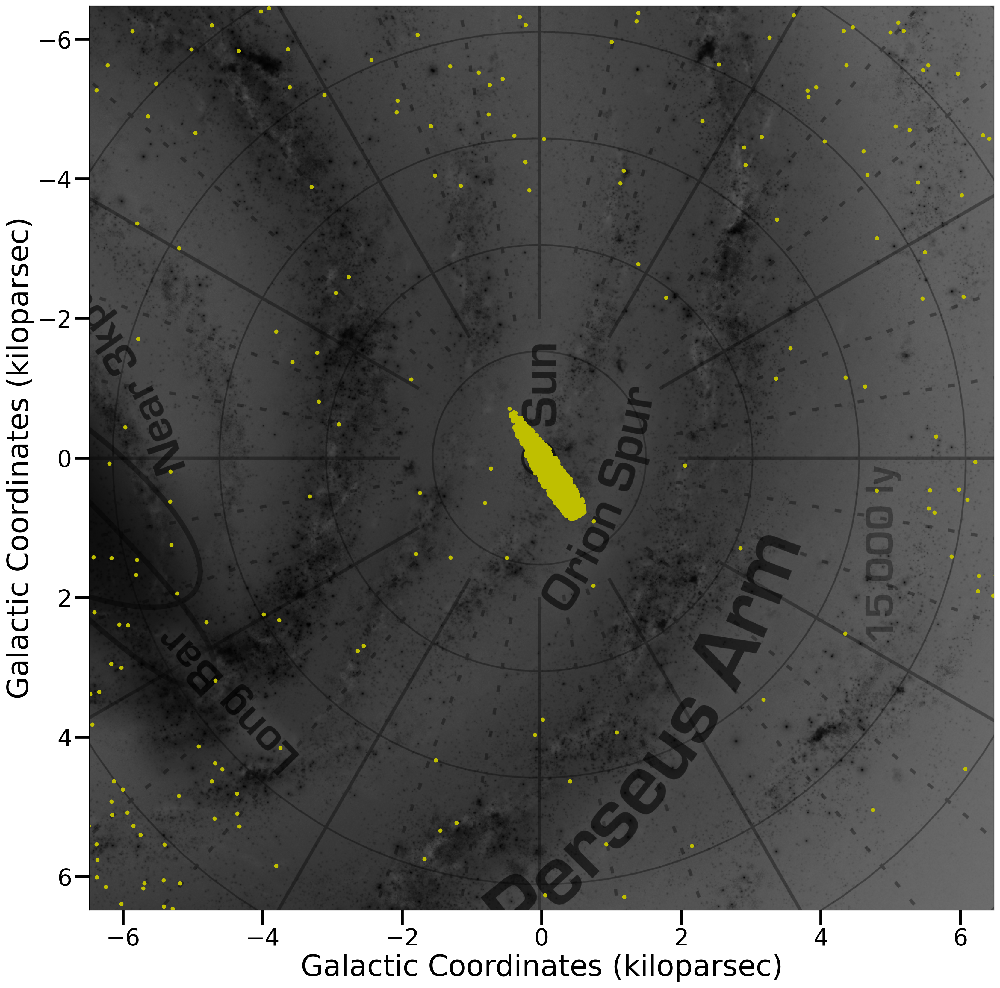

In [158]:
radius = pc['dist']*5
plot_instance = MWPlot(mode='face-on',
                       center=(0, 0)*u.kpc,
                       radius=radius*u.kpc,
                       unit=u.kpc,
                       coord='galactic',
                       annotation=True, 
                       rot180=False,
                       grayscale=True)
plot_instance.dpi = 200
plot_instance.clim = (5., 15.)
plot_instance.imalpha = .5
plot_instance.s = radius*2.5
plot_instance.mw_scatter(-a.galactic.cartesian.x, 
                         a.galactic.cartesian.y,
                         c='y')

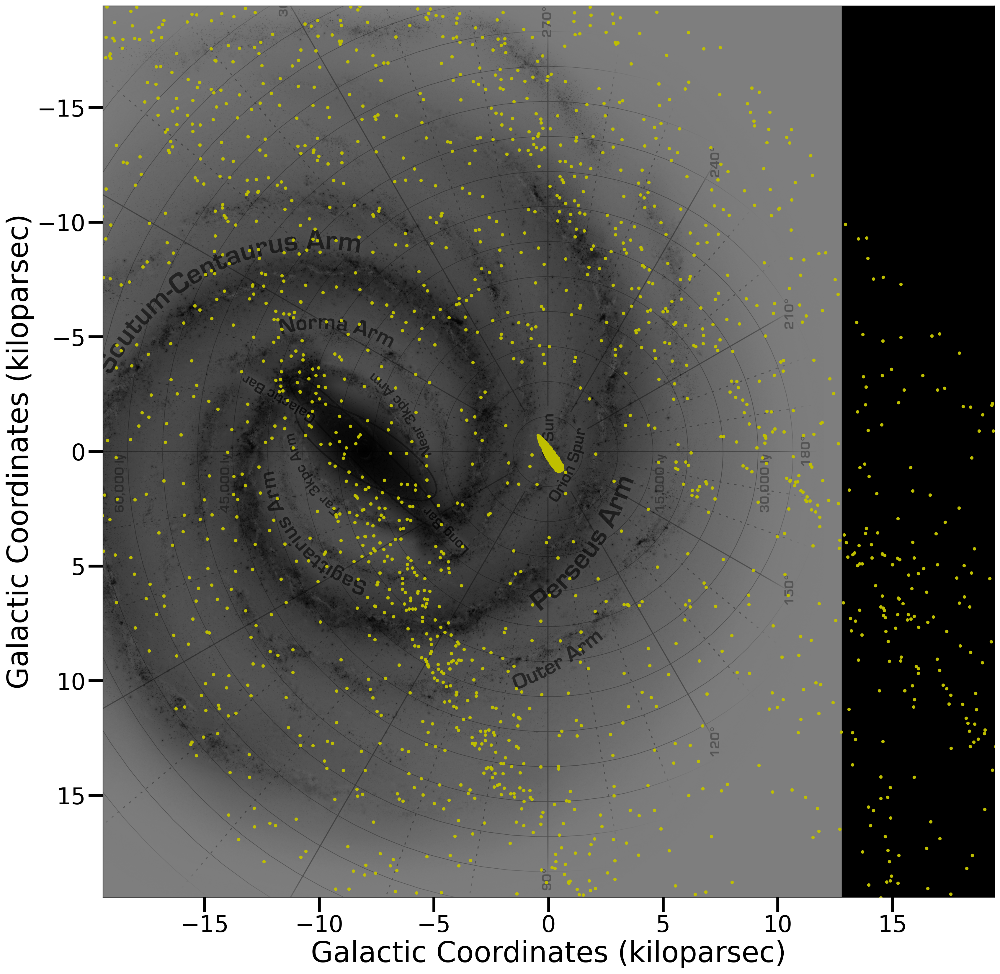

In [146]:
radius = pc['dist']*15
plot_instance = MWPlot(mode='face-on',
                       center=(0, 0)*u.kpc,
                       radius=radius*u.kpc,
                       unit=u.kpc,
                       coord='galactic',
                       annotation=True, 
                       rot180=False,
                       grayscale=True)
plot_instance.dpi = 200
plot_instance.clim = (5., 15.)
plot_instance.imalpha = .5
plot_instance.s = radius*.5
plot_instance.mw_scatter(-a.galactic.cartesian.x, 
                         a.galactic.cartesian.y,
                         c='y')